# TELECOMMUNICATION CUSTOMER CHURN

All over the world, Numerous telecom companies are present. To keep up in the competition and expand their business client have to invest in the market.

But, due to increasing competition, company is facing severe loss of revenue and loss of potential customers. So, the client wants to find out the reasons of 

losing customers by measuring customer loyalty to regain the lost customers. 

To find that out we perform the following steps:
#### 1.Data Overview

      1.1 Data Manipulation
#### 2. Exploratory Data Analysis
    
     2.1 Missing Value Imputation
        
     2.2 Univariate Analysis
    
     2.3 Bi-Variate Analysis
        
     2.4 Correlation
    
     2.5 Outlier Detection and treatment
        
     2.6 Concatenating Numerical and Categorical data
#### 3. Model Building and Evaluation

    3.1 Logistic Regression
    
    3.2 Decision Tree Classifier
    
    3.3 Random Forest Classifier
#### 4. Conclusion
    
    
    

In [1]:
# Importing libraries
import numpy as np #linear algebra
import pandas as pd #data precessing CSV file
import matplotlib.pyplot as plt #visualization
import seaborn as sns #visualization
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importing dataset
telcom = pd.read_csv("C:\\Users\\vansh\\Desktop\\telecom churn.csv")

## 1. DATA OVERVIEW

In [3]:
#First five rows of dataset
telcom.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day calls,total day charge,total eve calls,total eve charge,total night calls,total night charge,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25.0,110.0,45.07,99.0,16.78,91.0,11.01,3.0,2.70,1.0,False
1,OH,107,415,371-7191,no,yes,26.0,123.0,27.47,103.0,16.62,103.0,11.45,3.0,3.70,1.0,False
2,NJ,137,415,358-1921,no,no,0.0,114.0,41.38,110.0,10.30,104.0,7.32,5.0,3.29,0.0,False
3,OH,84,408,375-9999,yes,no,0.0,71.0,50.90,88.0,5.26,89.0,8.86,7.0,1.78,2.0,False
4,OK,75,415,330-6626,yes,no,0.0,113.0,28.34,122.0,12.61,121.0,8.41,3.0,2.73,3.0,False


In [4]:
#Last five rows of dataset
telcom.tail()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day calls,total day charge,total eve calls,total eve charge,total night calls,total night charge,total intl calls,total intl charge,customer service calls,churn
3328,AZ,192,415,414-4276,no,yes,36.0,77.0,26.55,126.0,18.32,83.0,12.56,6.0,2.67,2.0,False
3329,WV,68,415,370-3271,no,no,0.0,57.0,39.29,55.0,13.04,123.0,8.61,4.0,2.59,3.0,False
3330,RI,28,510,328-8230,no,no,0.0,109.0,30.74,58.0,24.55,91.0,8.64,6.0,3.81,2.0,False
3331,CT,184,510,364-6381,yes,no,0.0,105.0,36.35,84.0,13.57,137.0,6.26,10.0,1.35,2.0,False
3332,TN,74,415,400-4344,no,yes,25.0,113.0,39.85,82.0,22.60,77.0,10.86,4.0,3.70,0.0,False


In [5]:
print ("Rows    : " ,telcom.shape[0])
print ("Columns : " ,telcom.shape[1])
print ("\nFeatures : \n" ,telcom.columns.tolist())
print ("\nMissing values : " ,telcom.isnull().sum().values.sum())
print ("\nUnique values : \n" ,telcom.nunique())

Rows    :  3333
Columns :  17

Features : 
 ['state', 'account length', 'area code', 'phone number', 'international plan', 'voice mail plan', 'number vmail messages', 'total day calls', 'total day charge', 'total eve calls', 'total eve charge', 'total night calls', 'total night charge', 'total intl calls', 'total intl charge', 'customer service calls', 'churn']

Missing values :  22

Unique values : 
 state                       51
account length             212
area code                    3
phone number              3333
international plan           2
voice mail plan              2
number vmail messages       46
total day calls            119
total day charge          1666
total eve calls            123
total eve charge          1440
total night calls          120
total night charge         933
total intl calls            21
total intl charge          162
customer service calls      10
churn                        2
dtype: int64


In [6]:
type(telcom)

pandas.core.frame.DataFrame

In [7]:
#Shape of dataset
telcom.shape

(3333, 17)

In [8]:
# A concise summary of data set
telcom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3332 non-null   float64
 7   total day calls         3331 non-null   float64
 8   total day charge        3330 non-null   float64
 9   total eve calls         3331 non-null   float64
 10  total eve charge        3329 non-null   float64
 11  total night calls       3330 non-null   float64
 12  total night charge      3332 non-null   float64
 13  total intl calls        3331 non-null   float64
 14  total intl charge       3330 non-null   

In [9]:
#Finding missing values in the dataset
telcom.isnull().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     1
total day calls           2
total day charge          3
total eve calls           2
total eve charge          4
total night calls         3
total night charge        1
total intl calls          2
total intl charge         3
customer service calls    1
churn                     0
dtype: int64

In [10]:
# Running descriptive stats analysis on numerical variables
telcom.describe()

,account length,area code,number vmail messages,total day calls,total day charge,total eve calls,total eve charge,total night calls,total night charge,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3332.000000,3331.000000,3330.000000,3331.000000,3329.000000,3330.000000,3332.000000,3331.000000,3330.000000,3332.000000
mean,101.064806,437.182418,8.101441,100.423296,30.561532,100.114380,17.084875,100.101502,9.039874,4.479436,2.764598,1.562425
std,39.822106,42.371290,13.689700,20.068540,9.260180,19.927643,4.312225,19.574612,2.275994,2.461679,0.753954,1.315453
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000,1.040000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,87.000000,24.430000,87.000000,14.160000,87.000000,7.520000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,101.000000,30.500000,100.000000,17.110000,100.000000,9.050000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,114.000000,36.785000,114.000000,20.000000,113.000000,10.590000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,165.000000,59.640000,170.000000,30.910000,175.000000,17.770000,20.000000,5.400000,9.000000


In [11]:
# Running despcriptive stats on categorical variables
telcom.describe(include=[np.object])

,state,phone number,international plan,voice mail plan
count,3333,3333,3333,3333
unique,51,3333,2,2
top,WV,328-8179,no,no
freq,106,1,3010,2411


## 1.1 DATA MANIPULATION

In [12]:
#Converting area code into object
telcom["area code"] = telcom["area code"].astype(object)

In [13]:
#Converting churn into integer
telcom["churn"] = telcom["churn"].astype(int)

In [14]:
#Converting Account length to Categorical column
def accountlength_lab(telcom) :
    if telcom["account length"] <= 12 :
        return "Tenure_0-12"
    elif (telcom["account length"] > 12) & (telcom["account length"] <= 60) :
        return "Tenure_13-60"
    elif (telcom["account length"] > 60) & (telcom["account length"] <= 120) :
        return "Tenure_61-120"
    elif (telcom["account length"] > 120) & (telcom["account length"] <= 180) :
        return "Tenure_121-180"
    elif (telcom["account length"] > 180) & (telcom["account length"] <= 240) :
         return "Tenure_181-240"
    elif telcom["account length"] > 240 : 
        return "Tenure_gt_240"
telcom["account length_group"] = telcom.apply(lambda telcom: accountlength_lab(telcom),
                                                axis = 1)  

# 2. EDA (EXPLORATORY DATA ANALYSIS)

In EDA, we will do the following steps:

2.1 Missing Value Imputation

2.2 Univariate Analysis

2.3 Bi-Variate Analysis

2.4 Correlation

2.5 Outlier Detection and treatment

2.6 Concatenating Numerical and Categorical data

### 2.1 IMPUTING THE MISSING OR NULL VALUES

In [15]:
telcom = telcom.drop(['state', 'phone number'], axis=1)
#Dropping irrelevant columns.

In [16]:
telcom

,account length,area code,international plan,voice mail plan,number vmail messages,total day calls,total day charge,total eve calls,total eve charge,total night calls,total night charge,total intl calls,total intl charge,customer service calls,churn,account length_group
0,128,415,no,yes,25.0,110.0,45.07,99.0,16.78,91.0,11.01,3.0,2.70,1.0,0,Tenure_121-180
1,107,415,no,yes,26.0,123.0,27.47,103.0,16.62,103.0,11.45,3.0,3.70,1.0,0,Tenure_61-120
2,137,415,no,no,0.0,114.0,41.38,110.0,10.30,104.0,7.32,5.0,3.29,0.0,0,Tenure_121-180
3,84,408,yes,no,0.0,71.0,50.90,88.0,5.26,89.0,8.86,7.0,1.78,2.0,0,Tenure_61-120
4,75,415,yes,no,0.0,113.0,28.34,122.0,12.61,121.0,8.41,3.0,2.73,3.0,0,Tenure_61-120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,415,no,yes,36.0,77.0,26.55,126.0,18.32,83.0,12.56,6.0,2.67,2.0,0,Tenure_181-240
3329,68,415,no,no,0.0,57.0,39.29,55.0,13.04,123.0,8.61,4.0,2.59,3.0,0,Tenure_61-120
3330,28,510,no,no,0.0,109.0,30.74,58.0,24.55,91.0,8.64,6.0,3.81,2.0,0,Tenure_13-60
3331,184,510,yes,no,0.0,105.0,36.35,84.0,13.57,137.0,6.26,10.0,1.35,2.0,0,Tenure_181-240


<AxesSubplot:>

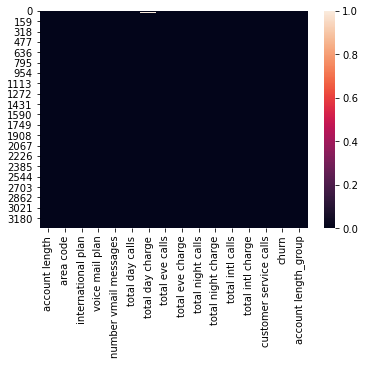

In [17]:
sns.heatmap(telcom.isnull())

In [18]:
# Imputing values through backward filling method.
telcom = telcom.fillna(method = 'bfill')

In [19]:
telcom.isnull().sum()

account length            0
area code                 0
international plan        0
voice mail plan           0
number vmail messages     0
total day calls           0
total day charge          0
total eve calls           0
total eve charge          0
total night calls         0
total night charge        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
account length_group      0
dtype: int64

### Checking for Rows Containing Duplicate Data

In [20]:
duplicate_rows_telcom = telcom[telcom.duplicated()]
print("Number of duplicate rows: ",
     duplicate_rows_telcom.shape)

Number of duplicate rows:  (0, 16)


No duplicate data.

### 2.2 UNIVARIATE ANALYSIS

In [21]:
telcom['churn'].value_counts()

0    2850
1     483
Name: churn, dtype: int64

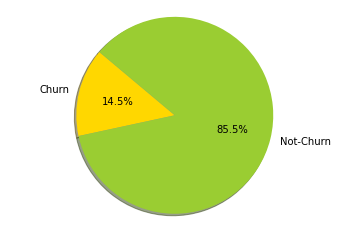

In [22]:
labels = 'Churn', 'Not-Churn'
sizes = [483, 2850]
colors = ['gold', 'yellowgreen']

# Plot
plt.pie(sizes, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=True, startangle=140)

plt.axis('equal')
plt.show()

From the pie chart, we observe that the churn rate for the company is 14.5%. We infer that customers are gradually migrating to competition.

<AxesSubplot:xlabel='international plan', ylabel='count'>

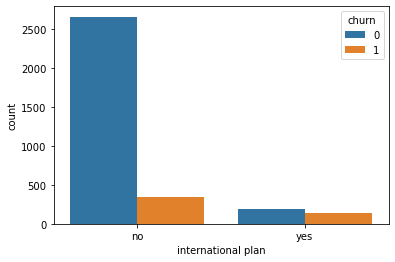

In [23]:
sns.countplot(x = 'international plan', data = telcom, hue = 'churn')

<AxesSubplot:xlabel='voice mail plan', ylabel='count'>

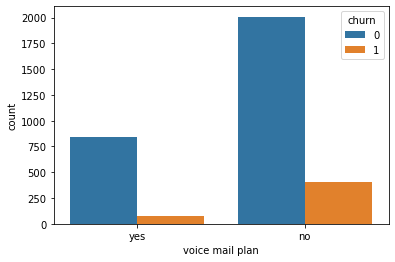

In [24]:
sns.countplot(x = 'voice mail plan', data = telcom, hue = 'churn')

When International Plan is enabled, the churn rate is much higher; the usage of the international plan by the customer is a strong feature. We do not observe the same effect with Voice mail plan.

<AxesSubplot:xlabel='area code', ylabel='count'>

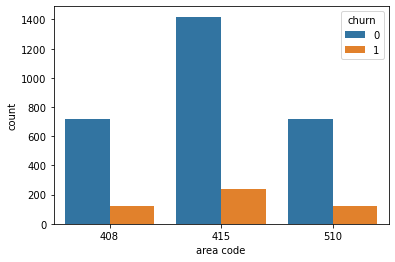

In [25]:
sns.countplot(x = 'area code', data = telcom, hue = 'churn')

Area code 415 has the maximum churned and non-churned customers.

array([[<AxesSubplot:title={'center':'account length'}>,
        <AxesSubplot:title={'center':'area code'}>,
        <AxesSubplot:title={'center':'number vmail messages'}>,
        <AxesSubplot:title={'center':'total day calls'}>],
       [<AxesSubplot:title={'center':'total day charge'}>,
        <AxesSubplot:title={'center':'total eve calls'}>,
        <AxesSubplot:title={'center':'total eve charge'}>,
        <AxesSubplot:title={'center':'total night calls'}>],
       [<AxesSubplot:title={'center':'total night charge'}>,
        <AxesSubplot:title={'center':'total intl calls'}>,
        <AxesSubplot:title={'center':'total intl charge'}>,
        <AxesSubplot:title={'center':'customer service calls'}>],
       [<AxesSubplot:title={'center':'churn'}>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

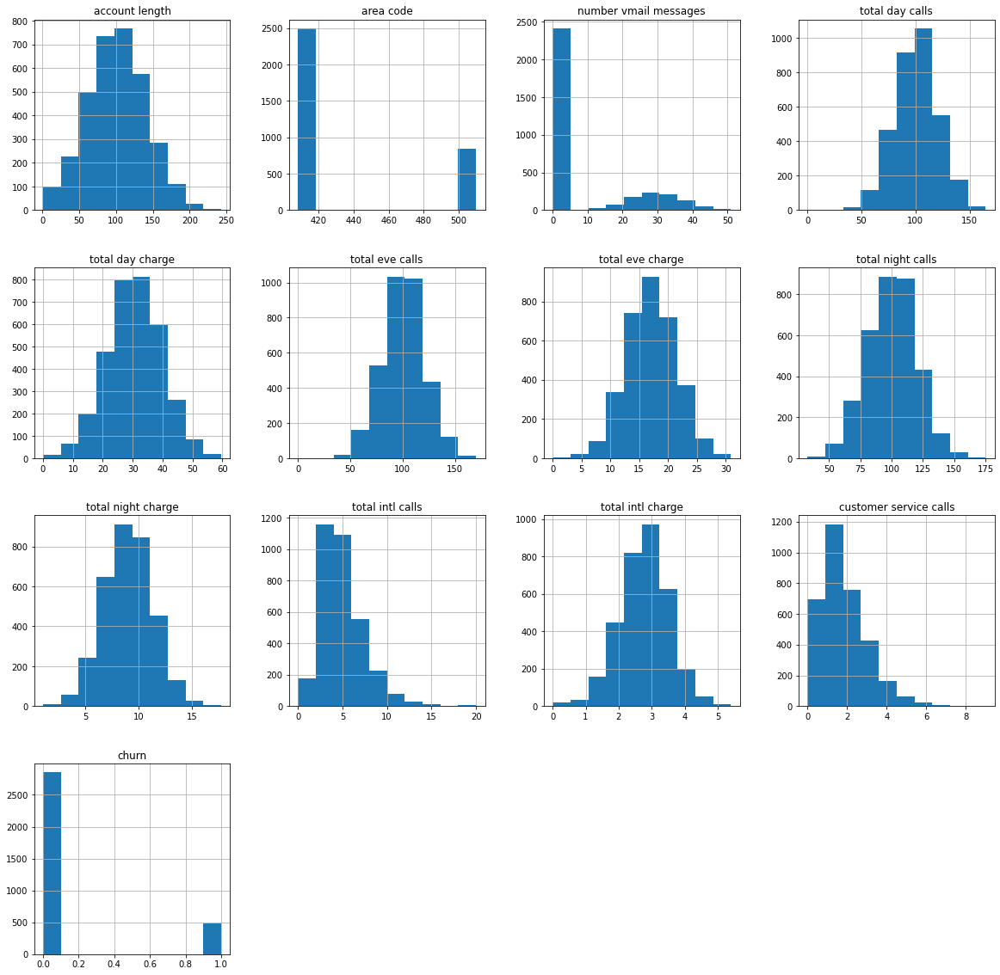

In [26]:
telcom.hist(figsize=(20,20))

<AxesSubplot:xlabel='total intl calls', ylabel='Density'>

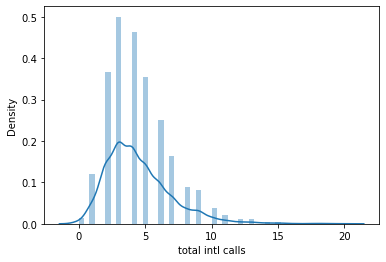

In [27]:
sns.distplot(telcom['total intl calls'])

<AxesSubplot:xlabel='customer service calls', ylabel='Density'>

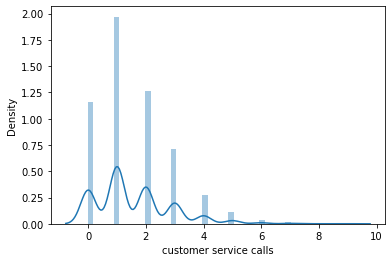

In [28]:
sns.distplot(telcom['customer service calls'])

<AxesSubplot:xlabel='number vmail messages', ylabel='Density'>

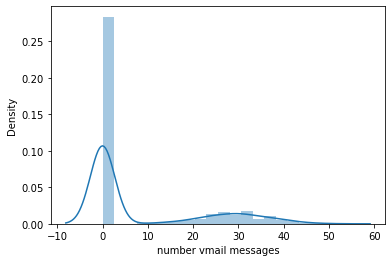

In [29]:
sns.distplot(telcom['number vmail messages'])

<AxesSubplot:xlabel='account length', ylabel='Density'>

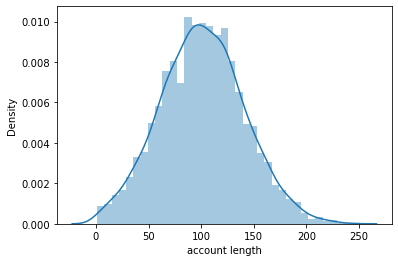

In [30]:
sns.distplot(telcom['account length'])

We observe that all the variables are normally distributed, except ‘Total intl calls’, ‘Number vmail messages’ and ‘Customer service calls. They are right-skewed.

### 2.3 BIVARIATE ANALYSIS

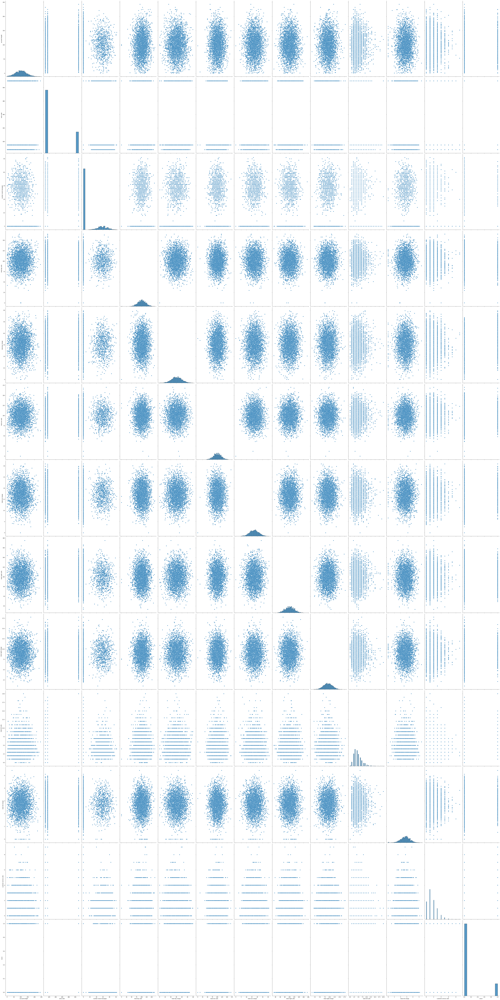

In [31]:
sns.pairplot(telcom, kind = 'scatter', height = 10, aspect = 0.5)

<AxesSubplot:xlabel='churn', ylabel='total night charge'>

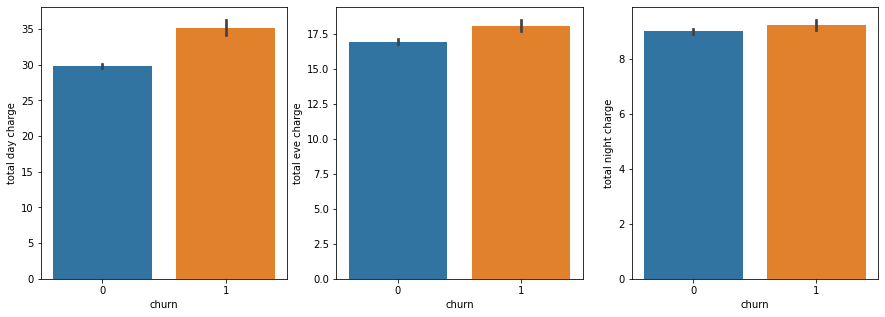

In [32]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.barplot(x = 'churn', y = 'total day charge', data = telcom, ax = ax[0])
sns.barplot(x = 'churn', y = 'total eve charge', data = telcom, ax = ax[1])
sns.barplot(x = 'churn', y = 'total night charge', data = telcom, ax = ax[2])

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Tenure_121-180'),
  Text(1, 0, 'Tenure_61-120'),
  Text(2, 0, 'Tenure_13-60'),
  Text(3, 0, 'Tenure_0-12'),
  Text(4, 0, 'Tenure_181-240'),
  Text(5, 0, 'Tenure_gt_240')])

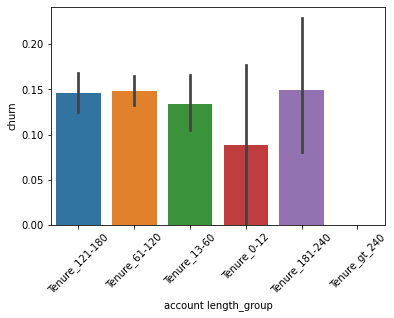

In [33]:
sns.barplot(x = 'account length_group', y = 'churn', data = telcom)
plt.xticks(rotation=45)

Comparing account length_group and churn, we observe that churn is lowest for members with tenure 0–12, and increases as the tenure period increase.

<AxesSubplot:xlabel='customer service calls', ylabel='churn'>

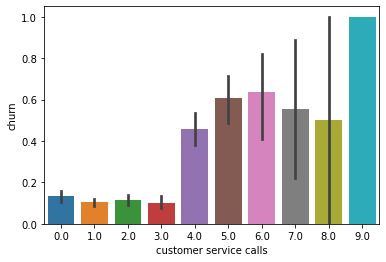

In [34]:
sns.barplot(x = 'customer service calls', y = 'churn', data = telcom)

Churn rate increases after 4 or more calls to the customer services.

<AxesSubplot:xlabel='total intl calls', ylabel='churn'>

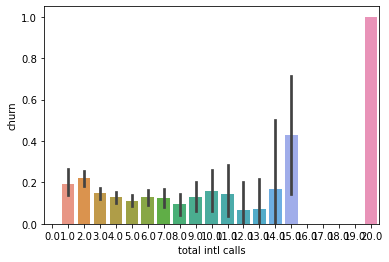

In [35]:
sns.barplot(x = 'total intl calls', y = 'churn', data = telcom)

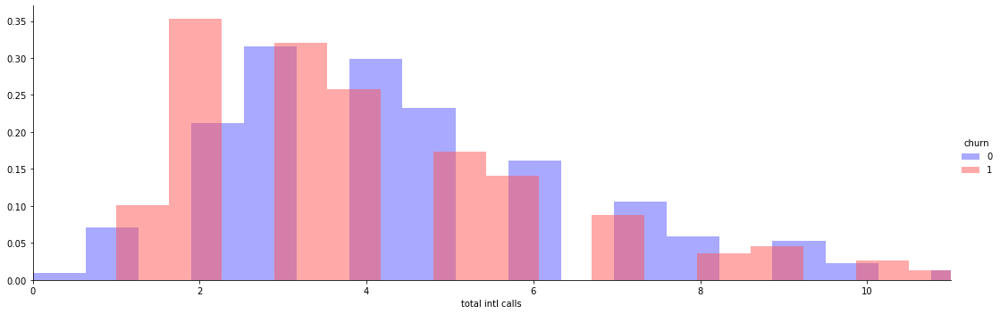

In [36]:
facet = sns.FacetGrid(telcom, hue='churn', size=5, aspect=3, palette='seismic')
facet.map(plt.hist, 'total intl calls', bins=30, alpha=0.5, density=True)
facet.set(xlim=(0,telcom.churn.max()+10))
facet.add_legend()

The total international calls data with churn shows that the churn rate was high when the total international calls were less and it gradually reduced with more and more international calls.

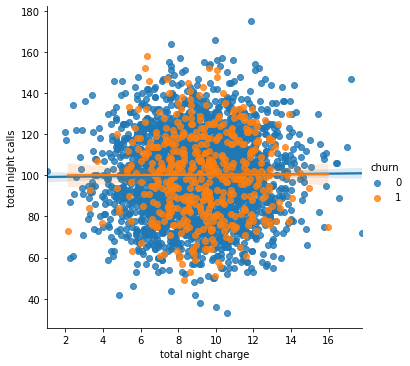

In [37]:
sns.lmplot('total night charge', 'total night calls', data = telcom, hue = 'churn')

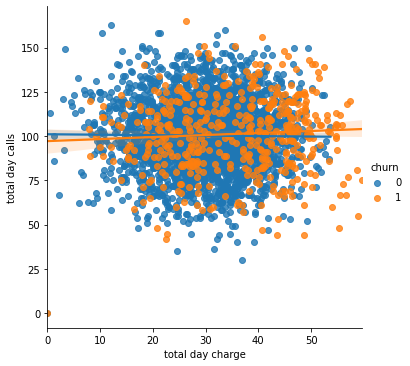

In [38]:
sns.lmplot('total day charge', 'total day calls', data = telcom, hue = 'churn')

Observing the scatter plot, it seems like customers churn increases when charges increase, but this is not absolutely clear, and we won't make any definitive conclusion from this chart.

### 2.4 CORRELATION MATRIX

In [39]:
corr = telcom.corr()
corr

,account length,area code,number vmail messages,total day calls,total day charge,total eve calls,total eve charge,total night calls,total night charge,total intl calls,total intl charge,customer service calls,churn
account length,1.000000,-0.012463,-0.004628,0.038243,0.005373,0.018674,-0.006506,-0.014684,-0.008943,0.020027,0.009838,-0.004323,0.016541
area code,-0.012463,1.000000,-0.001994,-0.009708,-0.009027,-0.012558,0.003020,0.016799,-0.006161,-0.024234,-0.017874,0.026792,0.006174
number vmail messages,-0.004628,-0.001994,1.000000,-0.008785,0.001026,-0.005452,0.018380,0.007444,0.007488,0.013880,0.002962,-0.012995,-0.089728
total day calls,0.038243,-0.009708,-0.008785,1.000000,0.006826,0.006708,-0.023137,-0.018269,0.022784,0.004236,0.019699,-0.017994,0.016266
total day charge,0.005373,-0.009027,0.001026,0.006826,1.000000,0.014745,0.006665,0.022430,0.004615,0.008507,-0.009822,-0.013587,0.205992
total eve calls,0.018674,-0.012558,-0.005452,0.006708,0.014745,1.000000,-0.010910,0.006776,-0.002283,0.019213,0.009085,0.002689,0.009133
total eve charge,-0.006506,0.003020,0.018380,-0.023137,0.006665,-0.010910,1.000000,0.008156,-0.013858,0.005231,-0.011432,-0.013203,0.094424
total night calls,-0.014684,0.016799,0.007444,-0.018269,0.022430,0.006776,0.008156,1.000000,0.011530,0.000542,-0.012752,-0.011274,0.003883
total night charge,-0.008943,-0.006161,0.007488,0.022784,0.004615,-0.002283,-0.013858,0.011530,1.000000,-0.013334,-0.015145,-0.009362,0.035564
total intl calls,0.020027,-0.024234,0.013880,0.004236,0.008507,0.019213,0.005231,0.000542,-0.013334,1.000000,0.032827,-0.016964,-0.052876


Text(0.5, 1.0, 'Correlation Matrix')

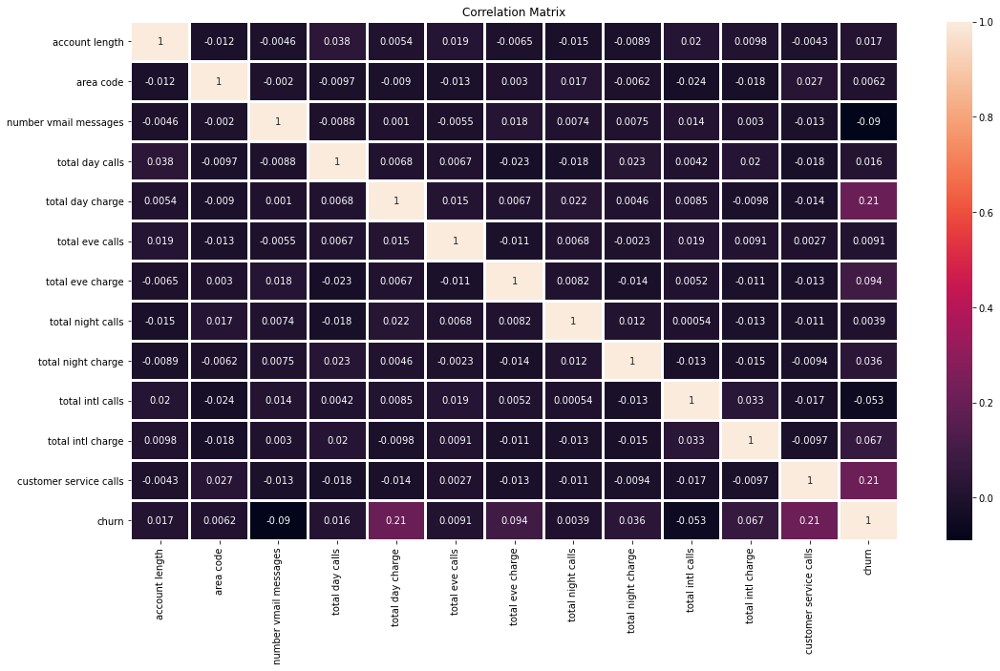

In [40]:
corr_matrix = telcom.corr()
f, ax = plt.subplots(figsize=(18, 10))
sns.heatmap(corr_matrix, linewidths=2.0, ax=ax, annot=True)
ax.set_title('Correlation Matrix')

The heatmap above shows the correlation between the variables. We observe that there is very less correlation among the variables. The maximum correlation value is 0.21 that is between 'total day charge' and 'churn' and 'customer service calls' and 'churn'.

<AxesSubplot:>

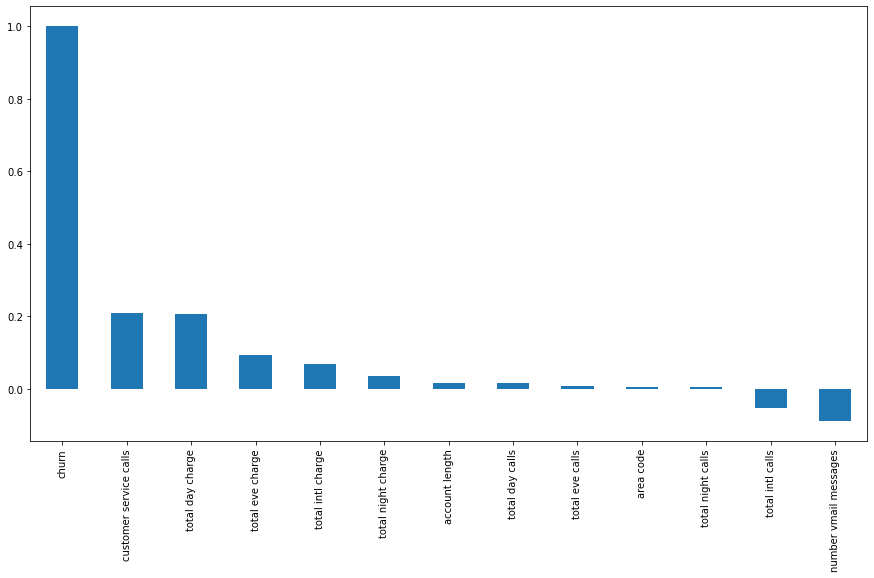

In [41]:
# Correlation of "Churn" with other variables:
plt.figure(figsize = (15,8))
telcom.corr()['churn'].sort_values(ascending = False).plot(kind='bar')

Churn has maximum correlation of 0.21 with 'Customer service calls' and 'Total day charge'. It has negative correlation of -0.053 and -0.09 with 'Total international calls' and 'number vmail messages' respectively.

### 2.5 OUTLIERS DETECTION AND TREATMENT

There were some outliers present in all the 9 variables. To treat those outliers we replaced them with the median value of those variables.

<AxesSubplot:xlabel='total intl calls'>

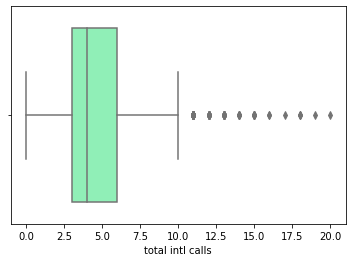

In [42]:
sns.boxplot(x = 'total intl calls', data = telcom, palette='rainbow')

In [43]:
# Replacing outliers from total intl calls.
print(telcom['total intl calls'].median())
q75 = telcom['total intl calls'].quantile(0.75)
q25 = telcom['total intl calls'].quantile(0.25)
iqr = q75 - q25
upper_limit = q75 + 1.5 * iqr
print(upper_limit)
telcom['total intl calls'] = np.where(telcom['total intl calls'] > 10.5, 4.0, telcom['total intl calls'])

4.0
10.5


<AxesSubplot:xlabel='total intl calls'>

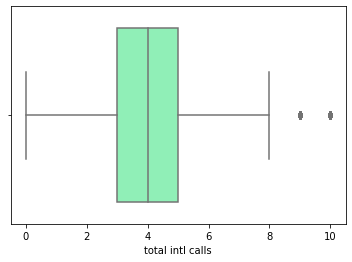

In [44]:
sns.boxplot(x = 'total intl calls', data = telcom, palette='rainbow')

<AxesSubplot:xlabel='total intl charge'>

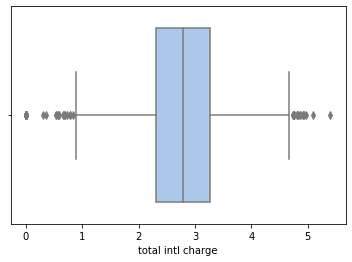

In [45]:
sns.boxplot(x = 'total intl charge', data = telcom, palette='pastel')

In [46]:
# Replacing outliers from total intl charges.
print(telcom['total intl charge'].median())
q75 = telcom['total intl charge'].quantile(0.75)
q25 = telcom['total intl charge'].quantile(0.25)
iqr = q75 - q25
upper_limit = q75 + 1.5 * iqr
lower_limit = q25 - 1.5 * iqr
print(upper_limit)
print(lower_limit)
telcom['total intl charge'] = np.where(telcom['total intl charge'] > 4.72, 2.78, telcom['total intl charge'])
telcom['total intl charge'] = np.where(telcom['total intl charge'] < 0.84, 2.78, telcom['total intl charge'])

2.78
4.7250000000000005
0.8449999999999995


<AxesSubplot:xlabel='total intl charge'>

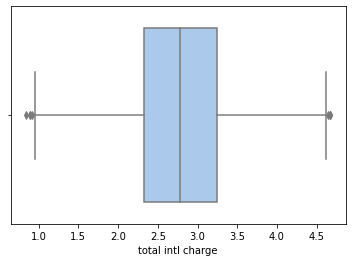

In [47]:
sns.boxplot(x = 'total intl charge', data = telcom, palette='pastel')

<AxesSubplot:xlabel='total day calls'>

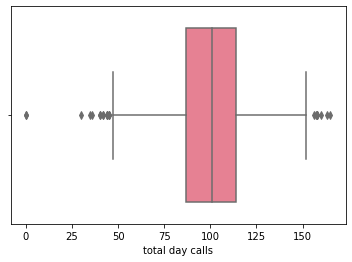

In [48]:
sns.boxplot(x = 'total day calls', data = telcom, palette='husl')

In [49]:
# Replacing outliers from total day calls.
print(telcom['total day calls'].median())
q75 = telcom['total day calls'].quantile(0.75)
q25 = telcom['total day calls'].quantile(0.25)
iqr = q75 - q25
upper_limit = q75 + 1.5 * iqr
lower_limit = q25 - 1.5 * iqr
print(upper_limit)
print(lower_limit)
telcom['total day calls'] = np.where(telcom['total day calls'] > 154.5 , 101, telcom['total day calls'])
telcom['total day calls'] = np.where(telcom['total day calls'] < 46.5 , 101, telcom['total day calls'])

101.0
154.5
46.5


<AxesSubplot:xlabel='total day calls'>

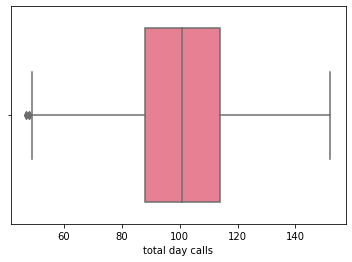

In [50]:
sns.boxplot(x = 'total day calls', data = telcom, palette='husl')

<AxesSubplot:xlabel='total day charge'>

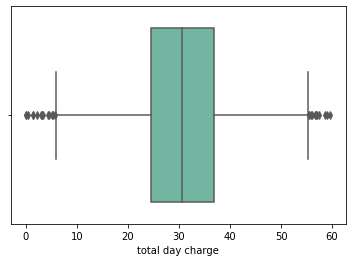

In [51]:
sns.boxplot(x = 'total day charge', data = telcom, palette='Set2')

In [52]:
# Replacing outliers from total day charges.
print(telcom['total day charge'].median())
q75 = telcom['total day charge'].quantile(0.75)
q25 = telcom['total day charge'].quantile(0.25)
iqr = q75 - q25
upper_limit = q75 + 1.5 * iqr
lower_limit = q25 - 1.5 * iqr
print(upper_limit)
print(lower_limit)
telcom['total day charge'] = np.where(telcom['total day charge'] > 55.33, 30.5, telcom['total day charge'])
telcom['total day charge'] = np.where(telcom['total day charge'] < 5.89, 30.5, telcom['total day charge'])

30.5
55.33
5.890000000000001


<AxesSubplot:xlabel='total day charge'>

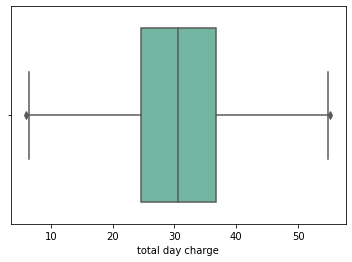

In [53]:
sns.boxplot(x = 'total day charge', data = telcom, palette='Set2')

<AxesSubplot:xlabel='total eve calls'>

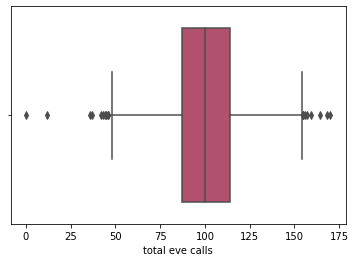

In [54]:
sns.boxplot(x = 'total eve calls', data = telcom, palette='flare')

In [55]:
# Replacing outliers from total eve calls.
print(telcom['total eve calls'].median())
q75 = telcom['total eve calls'].quantile(0.75)
q25 = telcom['total eve calls'].quantile(0.25)
iqr = q75 - q25
upper_limit = q75 + 1.5 * iqr
lower_limit = q25 - 1.5 * iqr
print(upper_limit)
print(lower_limit)
telcom['total eve calls'] = np.where(telcom['total eve calls'] > 154.5 , 100, telcom['total eve calls'])
telcom['total eve calls'] = np.where(telcom['total eve calls'] < 46.5 , 100, telcom['total eve calls'])

100.0
154.5
46.5


<AxesSubplot:xlabel='total eve calls'>

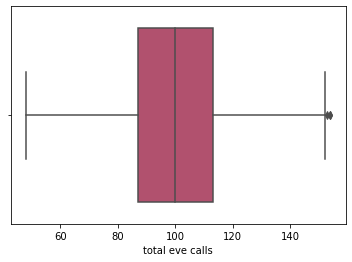

In [56]:
sns.boxplot(x = 'total eve calls', data = telcom, palette='flare')

<AxesSubplot:xlabel='total eve charge'>

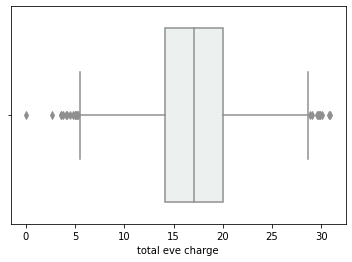

In [57]:
sns.boxplot(x = 'total eve charge', data = telcom, palette='light:#5A9')

In [58]:
# Replacing outliers from total eve charges.
print(telcom['total eve charge'].median())
q75 = telcom['total eve charge'].quantile(0.75)
q25 = telcom['total eve charge'].quantile(0.25)
iqr = q75 - q25
upper_limit = q75 + 1.5 * iqr
lower_limit = q25 - 1.5 * iqr
print(upper_limit)
print(lower_limit)
telcom['total eve charge'] = np.where(telcom['total eve charge'] >  28.81, 17.12, telcom['total eve charge'])
telcom['total eve charge'] = np.where(telcom['total eve charge'] <  5.37, 17.12, telcom['total eve charge'])

17.12
28.81
5.370000000000001


<AxesSubplot:xlabel='total eve charge'>

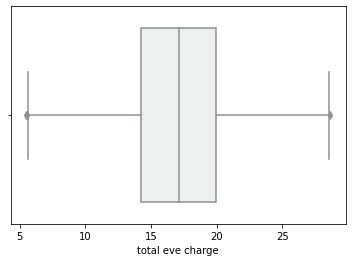

In [59]:
sns.boxplot(x = 'total eve charge', data = telcom, palette='light:#5A9')

<AxesSubplot:xlabel='total night calls'>

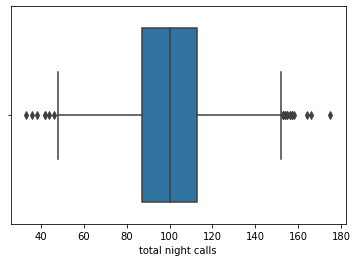

In [60]:
sns.boxplot(x = 'total night calls', data = telcom)

In [61]:
# Replacing outliers from total night calls.
print(telcom['total night calls'].median())
q75 = telcom['total night calls'].quantile(0.75)
q25 = telcom['total night calls'].quantile(0.25)
iqr = q75 - q25
upper_limit = q75 + 1.5 * iqr
lower_limit = q25 - 1.5 * iqr
print(upper_limit)
print(lower_limit)
telcom['total night calls'] = np.where(telcom['total night calls'] > 152.0 , 100, telcom['total night calls'])
telcom['total night calls'] = np.where(telcom['total night calls'] < 48.0 , 100, telcom['total night calls'])

100.0
152.0
48.0


<AxesSubplot:xlabel='total night calls'>

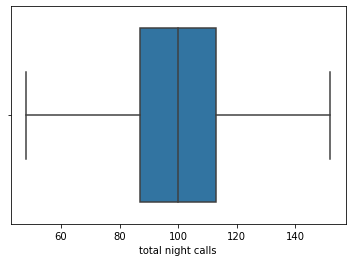

In [62]:
sns.boxplot(x = 'total night calls', data = telcom)

<AxesSubplot:xlabel='total night charge'>

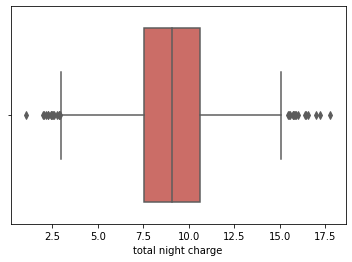

In [63]:
sns.boxplot(x = 'total night charge', data = telcom, palette='hls')

In [64]:
# Replacing outliers from total night charges.
print(telcom['total night charge'].median())
q75 = telcom['total night charge'].quantile(0.75)
q25 = telcom['total night charge'].quantile(0.25)
iqr = q75 - q25
upper_limit = q75 + 1.5 * iqr
lower_limit = q25 - 1.5 * iqr
print(upper_limit)
print(lower_limit)
telcom['total night charge'] = np.where(telcom['total night charge'] >  15.195, 9.05, telcom['total night charge'])
telcom['total night charge'] = np.where(telcom['total night charge'] <  2.914, 9.05, telcom['total night charge'])

9.05
15.195
2.914999999999999


<AxesSubplot:xlabel='total night charge'>

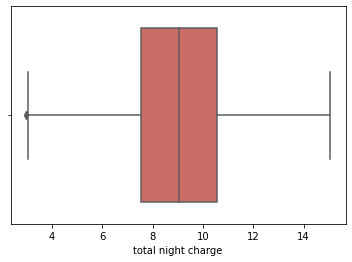

In [65]:
sns.boxplot(x = 'total night charge', data = telcom, palette='hls')

<AxesSubplot:xlabel='customer service calls'>

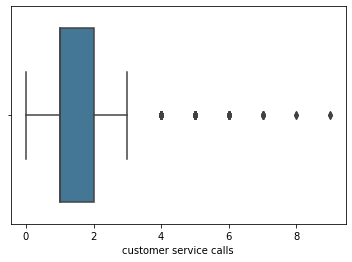

In [66]:
sns.boxplot(x = 'customer service calls', data = telcom, palette='mako')

In [67]:
# Replacing outliers from customer service calls.
print(telcom['customer service calls'].median())
q75 = telcom['customer service calls'].quantile(0.75)
q25 = telcom['customer service calls'].quantile(0.25)
iqr = q75 - q25
upper_limit = q75 + 1.5 * iqr
lower_limit = q25 - 1.5 * iqr
print(upper_limit)
print(lower_limit)
telcom['customer service calls'] = np.where(telcom['customer service calls'] > 3.5 , 1.0, telcom['customer service calls'])

1.0
3.5
-0.5


<AxesSubplot:xlabel='customer service calls'>

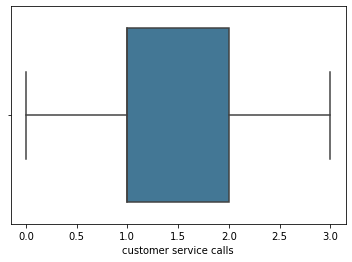

In [68]:
sns.boxplot(x = 'customer service calls', data = telcom, palette='mako')

### 2.6 CONCATENATING NUMERICAL AND CATEGORICAL DATA

In [69]:
# Categorical Data
telcom.select_dtypes(include = ['object']).columns.tolist()

['international plan', 'voice mail plan', 'account length_group']

In [70]:
telcom_dummies = pd.get_dummies(telcom[['area code', 'international plan', 'voice mail plan', 'account length_group']])

In [71]:
# Numerical Data
telcom_num = telcom[telcom.select_dtypes(include = [np.number]).columns.tolist()]

In [72]:
telcom_num.head()

,account length,area code,number vmail messages,total day calls,total day charge,total eve calls,total eve charge,total night calls,total night charge,total intl calls,total intl charge,customer service calls,churn
0,128,415,25.0,110.0,45.07,99.0,16.78,91.0,11.01,3.0,2.70,1.0,0
1,107,415,26.0,123.0,27.47,103.0,16.62,103.0,11.45,3.0,3.70,1.0,0
2,137,415,0.0,114.0,41.38,110.0,10.30,104.0,7.32,5.0,3.29,0.0,0
3,84,408,0.0,71.0,50.90,88.0,17.12,89.0,8.86,7.0,1.78,2.0,0
4,75,415,0.0,113.0,28.34,122.0,12.61,121.0,8.41,3.0,2.73,3.0,0


In [73]:
telcom_new = pd.concat([telcom_num, telcom_dummies], axis=1)

In [74]:
telcom_new.head()

,account length,area code,number vmail messages,total day calls,total day charge,total eve calls,total eve charge,total night calls,total night charge,total intl calls,...,international plan_no,international plan_yes,voice mail plan_no,voice mail plan_yes,account length_group_Tenure_0-12,account length_group_Tenure_121-180,account length_group_Tenure_13-60,account length_group_Tenure_181-240,account length_group_Tenure_61-120,account length_group_Tenure_gt_240
0,128,415,25.0,110.0,45.07,99.0,16.78,91.0,11.01,3.0,...,1,0,0,1,0,1,0,0,0,0
1,107,415,26.0,123.0,27.47,103.0,16.62,103.0,11.45,3.0,...,1,0,0,1,0,0,0,0,1,0
2,137,415,0.0,114.0,41.38,110.0,10.30,104.0,7.32,5.0,...,1,0,1,0,0,1,0,0,0,0
3,84,408,0.0,71.0,50.90,88.0,17.12,89.0,8.86,7.0,...,0,1,1,0,0,0,0,0,1,0
4,75,415,0.0,113.0,28.34,122.0,12.61,121.0,8.41,3.0,...,0,1,1,0,0,0,0,0,1,0


# 3. MODEL BUILDING

## 3.1 LOGISTIC REGRESSION

Logistic regression is a fundamental classification technique. 

We run logistic regression instead of linear regression as our target variable, “Churn” is categorical variable.

Logistic regression is fast and relatively uncomplicated, and it’s convenient to interpret. 

In [75]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from sklearn.metrics import f1_score
import statsmodels.api as sm
from sklearn.metrics import precision_score,recall_score

In [76]:
target_col=["churn"]

### Train and Test Model

In [77]:
train,test = train_test_split(telcom_new,test_size = 0.25 ,random_state = 101)

In [78]:
#separating dependent and independent variables
cols    = [i for i in telcom_new.columns if i not in target_col]
train_X = train[cols]
train_Y = train[target_col]
test_X  = test[cols]
test_Y  = test[target_col]

In [79]:
lr = LogisticRegression()
lr.fit(train_X,train_Y)
y_pred1 = lr.predict(test_X)
y_pred1

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

## Model Evaluation

### Confusion matrix

In [80]:
# View confusion matrix for test data and predictions
confusion_matrix(test_Y, y_pred1)

array([[729,   0],
       [101,   4]], dtype=int64)

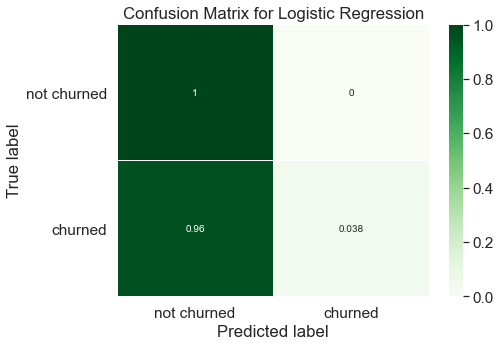

In [81]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(test_Y, y_pred1)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(7,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

# Add labels to the plot
class_names = ['not churned','churned']
tick_marks = np.arange(len(class_names))
tick_marks = tick_marks +0.5
tick_marks2 = tick_marks + 0
plt.xticks(tick_marks, class_names, rotation=0)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()


The Non Churn customers are being predicted better than the Churn customers. 

### ROC AUC and F1 Score

In [82]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
accuracy = accuracy_score(test_Y, y_pred1)
f1 = f1_score(test_Y, y_pred1)
precision = precision_score(test_Y, y_pred1)
recall = recall_score(test_Y, y_pred1)
roc_auc = roc_auc_score(test_Y, y_pred1)
print('Accuracy is :' ,accuracy)
print('F1 score is :' ,f1)
print('Precision is :' ,precision)
print('Recall is :' ,recall)
print('Roc Auc is :' ,roc_auc)

Accuracy is : 0.8788968824940048
F1 score is : 0.07339449541284404
Precision is : 1.0
Recall is : 0.0380952380952381
Roc Auc is : 0.5190476190476191


## 3.2 DECISION TREE CLASSIFIER

Decision trees are popular and powerful tool used for classification and prediction purposes.

It works for both continuous and categorical input and output variables.

In [83]:
# seed (101)
# import tree classifier 
from sklearn import tree

train,test = train_test_split(telcom_new,test_size = 0.25 ,random_state = 101)

In [84]:
#separating dependent and independent variables
cols    = [i for i in telcom_new.columns if i not in target_col]
train_X1 = train[cols]
train_Y1 = train[target_col]
test_X1  = test[cols]
test_Y1  = test[target_col]

In [85]:
dt1 = tree.DecisionTreeClassifier()
model1 = dt1.fit(train_X1,train_Y1)
y_pred4 = dt1.predict(test_X1)
y_pred4

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0,

In [86]:
dt1.predict_proba(test_X1)

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]])

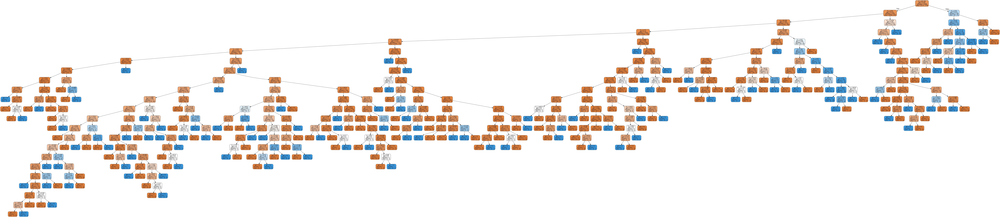

In [87]:
# Plotting Tree

import graphviz 
from six import StringIO  
import sys
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dt1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graphviz.Source(graph)  
Image(graph.create_png())

### Feature importance

In [88]:
importances1 = model1.feature_importances_

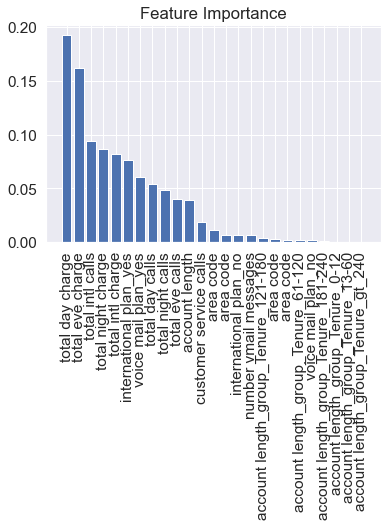

In [89]:
# sort feature importances in descending order

indices = np.argsort(importances1)[::-1]

#rearrange feature names so they match the sorted feature importances

names= [train_X1.columns[i] for i in indices]

#create plot
plt.figure()

#create plot title
plt.title('Feature Importance')

#add bars

plt.bar(range(train_X1.shape[1]), importances1[indices])

#add feature names as x-axis labels

plt.xticks(range(train_X1.shape[1]), names, rotation=90)
#Show plot
plt.show()

## Model Evaluation 

### Confusion Matrix 

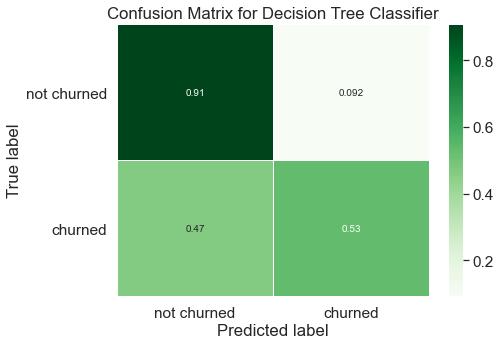

In [90]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(test_Y1, y_pred4)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(7,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

# Add labels to the plot
class_names = ['not churned','churned']
tick_marks = np.arange(len(class_names))
tick_marks = tick_marks +0.5
tick_marks2 = tick_marks + 0
plt.xticks(tick_marks, class_names, rotation=0)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

The Non Churn customers are being predicted better than the Churn customers.

In [91]:
# View confusion matrix for test data and predictions
confusion_matrix(test_Y1, y_pred4)

array([[662,  67],
       [ 49,  56]], dtype=int64)

### ROC AUC and F1 Score 

In [92]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
accuracy = accuracy_score(test_Y1, y_pred4)
f1 = f1_score(test_Y1, y_pred4)
precision = precision_score(test_Y1, y_pred4)
recall = recall_score(test_Y1, y_pred4)
roc_auc = roc_auc_score(test_Y1, y_pred4)
print('Accuracy is :' ,accuracy)
print('F1 score is :' ,f1)
print('Precision is :' ,precision)
print('Recall is :' ,recall)
print('Roc Auc is :' ,roc_auc)

Accuracy is : 0.8609112709832134
F1 score is : 0.49122807017543857
Precision is : 0.45528455284552843
Recall is : 0.5333333333333333
Roc Auc is : 0.720713305898491


## 3.3 RANDOM FOREST CLASSIFIER

A random forest takes random samples, forms many decision trees, and then takes the average of those decisions to form a more refined model.

It emphasizes on feature selection and does not assume that the model has a linear relationship — like regression models do.

### Test and Train model

In [93]:
# seed (101)
# import random forest 
from sklearn.ensemble import RandomForestClassifier

train,test = train_test_split(telcom_new,test_size = 0.25 ,random_state = 101)

In [94]:
#separating dependent and independent variables
cols     = [i for i in telcom_new.columns if i not in target_col]
train_X2 = train[cols]
train_Y2 = train[target_col]
test_X2  = test[cols]
test_Y2  = test[target_col]

In [95]:
#build a classifier
rf= RandomForestClassifier(n_estimators= 100)

#train the model using the training set
model = rf.fit(train_X2, train_Y2)

#Predict the response of the test data set
y_pred3 = rf.predict(test_X2)
y_pred3

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,

### For accuracy

In [96]:
# Import scikit-learn metrics module for accuracy calculation

from sklearn import metrics

# Model accuracy, how often is the classifier correct?

print('Accuracy:', metrics.accuracy_score(test_Y2, y_pred3))

# Model precision

print('Precision:', metrics.precision_score(test_Y2, y_pred3))

# Model recall

print('Recall:', metrics.recall_score(test_Y2, y_pred3))

Accuracy: 0.920863309352518
Precision: 0.8823529411764706
Recall: 0.42857142857142855


### Tuning using 2 techniques 
1. Random search
2. Grid search

### 1.  Random Search

In [97]:
from time import time
from scipy.stats import randint as sp_randint
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

In [98]:
# utility function to report best scores

def report(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print('Model with rank:{0}'.format(i))
            print('Mean validation score:{0:.3f} (std: {1:.3f})'.format(
                results["mean_test_score"][candidate], 
                results["std_test_score"][candidate]))
            print('parameters:{0}'.format(results['params'][candidate]))
            print("")

#specify parameters and distributions to sample from
param_dist = {"max_depth": [3, None],
             "max_features": sp_randint(1,11),
              "min_samples_split": sp_randint(2,11),
             "bootstrap": [True, False],
             "criterion": ["gini", "entropy"]}

# run randomised search
n_iter_search = 20
random_search = RandomizedSearchCV(rf, param_distributions= param_dist,
                                  n_iter=n_iter_search, cv=5)

start = time()
random_search.fit(train_X2, train_Y2)
print("RandomizedSearchCV took %.2f seconds for %d candidates"
     "parameter settings." % ((time() - start), n_iter_search))
report(random_search.cv_results_)
    

RandomizedSearchCV took 54.45 seconds for 20 candidatesparameter settings.
Model with rank:1
Mean validation score:0.917 (std: 0.008)
parameters:{'bootstrap': True, 'criterion': 'entropy', 'max_depth': None, 'max_features': 8, 'min_samples_split': 5}

Model with rank:2
Mean validation score:0.917 (std: 0.008)
parameters:{'bootstrap': True, 'criterion': 'entropy', 'max_depth': None, 'max_features': 9, 'min_samples_split': 8}

Model with rank:3
Mean validation score:0.917 (std: 0.009)
parameters:{'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 10, 'min_samples_split': 4}



### 2. Grid Search

In [99]:
# use a full grid over all parameters

param_grid = {"max_depth": [3,None],
             "max_features": [1,3,10],
              "min_samples_split": [2,3,10],
             "bootstrap": [True, False],
             "criterion": ['gini', 'entropy']}

#run grid search

grid_search = GridSearchCV(rf, param_grid = param_grid, cv= 5)
start = time()
grid_search.fit(train_X2, train_Y2)

print('GridSrearchCV took %.2f seconds for %d candidate parameter settings.'
     % (time() - start, len(grid_search.cv_results_['params'])))
report(grid_search.cv_results_)

GridSrearchCV took 173.26 seconds for 72 candidate parameter settings.
Model with rank:1
Mean validation score:0.918 (std: 0.008)
parameters:{'bootstrap': True, 'criterion': 'entropy', 'max_depth': None, 'max_features': 10, 'min_samples_split': 3}

Model with rank:2
Mean validation score:0.917 (std: 0.007)
parameters:{'bootstrap': True, 'criterion': 'entropy', 'max_depth': None, 'max_features': 10, 'min_samples_split': 10}

Model with rank:2
Mean validation score:0.917 (std: 0.007)
parameters:{'bootstrap': False, 'criterion': 'entropy', 'max_depth': None, 'max_features': 10, 'min_samples_split': 2}



## Checking for accuracy

### Random Search Accuracy

In [100]:
# now run the random forest with the best parameters of search

# build a classifier with best of Random search 
rf_random_search = RandomForestClassifier(n_estimators= 100, bootstrap= True, criterion = 'gini', max_features= 10, min_samples_split= 10)

#train the model using the training sets with best of random search

rf_random_search.fit(train_X2,train_Y2)

#predict the response for test dataset with best of random search

y_pred3 = rf_random_search.predict(test_X2)

#model accuracy, how often is the classifier correct

print('Accuracy:', metrics.accuracy_score(test_Y2,y_pred3))

#model precision

print('Model Precision:', metrics.precision_score(test_Y2,y_pred3))

#model recall

print("Recall:", metrics.recall_score(test_Y2,y_pred3))

#model F1 score

print("F1:", metrics.f1_score(test_Y2, y_pred3))

Accuracy: 0.9256594724220624
Model Precision: 0.8771929824561403
Recall: 0.47619047619047616
F1: 0.6172839506172839


### Grid Search Accuracy

In [101]:
# now run the random forest with the best parameters of search

# build a classifier with best of grid search 
rf_grid_search = RandomForestClassifier(n_estimators= 100, bootstrap= False, criterion = 'gini', max_features= 10, min_samples_split= 2)

#train the model using the training sets with best of grid search

rf_grid_search.fit(train_X2,train_Y2)

#predict the response for test dataset with best of grid search

y_pred3 = rf_grid_search.predict(test_X2)

#model accuracy ie how often is the classifier correct

print('Accuracy:', metrics.accuracy_score(test_Y2,y_pred3))

#model precision

print('Model Precision:', metrics.precision_score(test_Y2,y_pred3))

#model recall

print("Recall:", metrics.recall_score(test_Y2,y_pred3))

#model F1 score

print("F1:", metrics.f1_score(test_Y2, y_pred3))

Accuracy: 0.9232613908872902
Model Precision: 0.8360655737704918
Recall: 0.4857142857142857
F1: 0.6144578313253012


### Feature importance

In [102]:
importances = model.feature_importances_

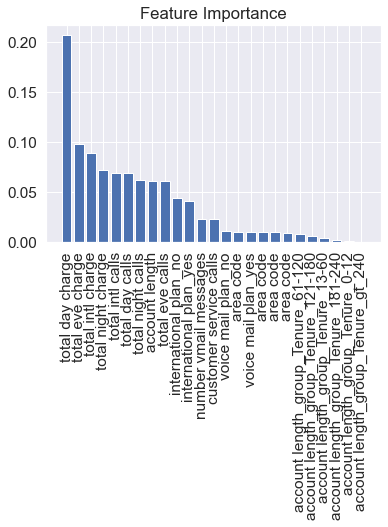

In [103]:
# sort feature importances in descending order

indices = np.argsort(importances)[::-1]

#rearrange feature names so they match the sorted feature importances

names= [train_X2.columns[i] for i in indices]

#create plot
plt.figure()

#create plot title
plt.title('Feature Importance')

#add bars

plt.bar(range(train_X2.shape[1]), importances[indices])

#add feature names as x-axis labels

plt.xticks(range(train_X2.shape[1]), names, rotation=90)
#Show plot
plt.show()

## Model evaluation

### Confusion Matrix

In [104]:
# View confusion matrix for test data and predictions
confusion_matrix(test_Y2, y_pred3)

array([[719,  10],
       [ 54,  51]], dtype=int64)

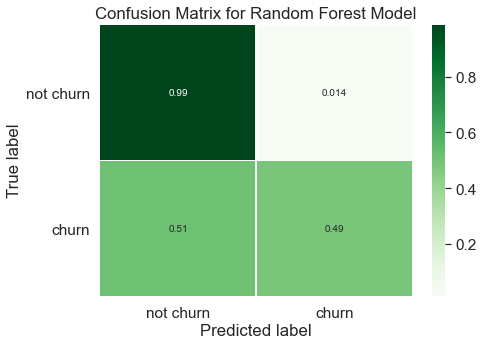

In [105]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(test_Y2, y_pred3)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(7,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

# Add labels to the plot
class_names = ['not churn','churn']
tick_marks = np.arange(len(class_names))
tick_marks = tick_marks +0.5
tick_marks2 = tick_marks + 0
plt.xticks(tick_marks, class_names, rotation=0)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Random Forest Model')
plt.show()


The Non Churn customers are being predicted better than the Churn customers.

In [108]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
accuracy = accuracy_score(test_Y2, y_pred3)
f1 = f1_score(test_Y2, y_pred3)
precision = precision_score(test_Y2, y_pred3)
recall = recall_score(test_Y2, y_pred3)
roc_auc = roc_auc_score(test_Y2, y_pred3)
print('Accuracy is :' ,accuracy)
print('F1 score is :' ,f1)
print('Precision is :' ,precision)
print('Recall is :' ,recall)
print('Roc Auc is :' ,roc_auc)

Accuracy is : 0.9232613908872902
F1 score is : 0.6144578313253012
Precision is : 0.8360655737704918
Recall is : 0.4857142857142857
Roc Auc is : 0.7359984322947286


## Conclusion 
Since, the key motive is to regain the customers and increase profitability to further expand their business, F1 score is important.

Also, due to uneven churn data, F1 score holds more weightage in model selection and is far more useful than accuracy.

Therefore, Random forest is probably the best choice. 
